# Question 1

For this particular question we used the files in the folder combined, by trying to extract the data from a different time and offset so that we are able to extract the actual change in data

X_train shape: (6, 1000, 3)
y_train shape: (6,)
(array([3]),)
(array([5]),)
(array([4]),)
(array([1]),)
(array([2]),)
(array([0]),)


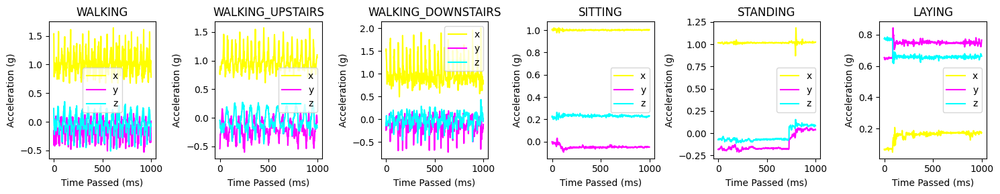

In [114]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
import os

time = 20
offset = 1000
folders = ["LAYING", "SITTING", "STANDING", "WALKING", "WALKING_DOWNSTAIRS", "WALKING_UPSTAIRS"]
classes = {"WALKING": 1, "WALKING_UPSTAIRS": 2, "WALKING_DOWNSTAIRS": 3, "SITTING": 4, "STANDING": 5, "LAYING": 6}
combined_dir = os.path.join("Combined")
dataset_dir = os.path.join(combined_dir, "Train")  # Focus on the training set

# Load and prepare data
X_train = [] # Sensor data
y_train = [] # Activity labels

# Get acitivity data
for folder in folders:
    files = os.listdir(os.path.join(dataset_dir, folder))
    # Only get the first file for each activity
    file = files[5]

    df = pd.read_csv(os.path.join(dataset_dir, folder, file), sep=",", header=0)
    # Skip first 100 rows and get 50 seconds of data to avoid initial and ending noise
    df = df[offset:offset + time * 50]

    X_train.append(df.values)
    y_train.append(classes[folder])

X_train = np.array(X_train)
y_train = np.array(y_train)

print("X_train shape:", X_train.shape) # 3D array
print("y_train shape:", y_train.shape) # 1D array

# Define a list of activities
activities = ["WALKING", "WALKING_UPSTAIRS", "WALKING_DOWNSTAIRS", "SITTING", "STANDING", "LAYING"]

# Create a figure and axes for subplots with 6 columns and 1 row
fig, axes = plt.subplots(figsize=(15, 3), nrows=1, ncols=6)

# Iterate through each activity
for i, activity in enumerate(activities):
    # Find the index of the first sample data (y_train) that corresponds to a specific activity class.
    # Since y_train is a 1D array, we can use np.where to find the index of the first occurrence of the activity class.
    act_ind = np.where(y_train == (i + 1))[0][0]
    print(np.where(y_train == (i + 1)))
    sample_data = X_train[act_ind]

    # Plot the accelerometer data for each axis
    axes[i].plot(sample_data[:, 0], label='x', color='yellow')
    axes[i].plot(sample_data[:, 1], label='y', color='magenta')
    axes[i].plot(sample_data[:, 2], label='z', color='cyan')

    # Set the title and labels
    axes[i].set_title(activity)
    axes[i].set_xlabel('Time Passed (ms)')
    axes[i].set_ylabel('Acceleration (g)')
    axes[i].legend()

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

**Observations:**

Following observations are general to all the sample data.

1. Laying: The acceleration in the x-axis is low, nearly 0. This is likely due to the orientation of the phone being flat, which makes the x-axis horizontal. Moreover, the x-axis acceleration is fairly stable compared to dynamic situations. The y-axis and z-axis accelerations are in an almost vertical direction, and taking the square roots of their squared sums would get us nearly to 1. The graph of this activity doesn't perform laying from other positions; it is the laying position throughout.

2. Standing: The acceleration in the x-axis is high, nearly 1. This is likely due to the orientation of the phone being vertical, which makes the x-axis vertical. Moreover, the x-axis acceleration is fairly stable compared to dynamic situations. The y-axis and z-axis acceleration again vary due to changes in the orientation of the phone in those axes. The graph of this activity doesn't perform laying from other positions; it is the laying position throughout.

3. Sitting: The graph of this activity performs the sitting action from another position which cases a significant change in the accelerations. The x-axis acceleration increases for a certain amount of time when the person is sitting, since the phone practically moves downwards there is a upward bump in the x-axis acceleration. When the person has been sat, the x-axis acceleration returns to what it was before. The y and z axes change of acceleration doeesn't really mean anything, its just the way a person sits which also affects those axes.

4. All the dynamic activities show unstable varying accelerations along all the axes. The x-axis acceleration stay near 1 as the phone is in vertical position which makes the x-axis also vertical. It varies heavily due to the body's motion. The y and z axes acceleration stay near 0 as these axes are horizontal.

5. Distinguishing between the dynamic situation and the static situation can be done by looking at how freqently do the accelerations vary.

6. Distinguishing between the static situations can be done as each have unique characteristics discussed in points 1, 2 and

7. Distinguishing between the dynamic situations seems difficult upfront due to lack of any unique patterns or characteristics of these activities. However, upon having a closer look at the patterns, an ML model might be able to distinguish but probably with not so significant accuracy.

**Verdict:** The ML model can differentiate dynamic and static situations, and identify activities in static situations. However, it may struggle to accurately distinguish activities within dynamic situations.


# Question 2
Before executing the data, the X_train is reobtained as required by keeping time = 10 sec ,and offset as 100.
The following code was directly taken from the existing code.

## Reobtaining Data

In [115]:
#=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=
#
#                                   ES335- Machine Learning- Assignment 1
#
# This file is used to create the dataset for the mini-project. The dataset is created by reading the data from
# the Combined folder. The data is then split into training, testing, and validation sets. This split is supposed
# to be used for all the modeling purposes.
#
#=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=


# Constants
time = 10
offset = 100
folders = ["LAYING","SITTING","STANDING","WALKING","WALKING_DOWNSTAIRS","WALKING_UPSTAIRS"]
classes = {"WALKING":1,"WALKING_UPSTAIRS":2,"WALKING_DOWNSTAIRS":3,"SITTING":4,"STANDING":5,"LAYING":6}



combined_dir = os.path.join("Combined")

#=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-==-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=
                                                # Train Dataset
#=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-==-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=

X_train=[]
y_train=[]
dataset_dir = os.path.join(combined_dir,"Train")

for folder in folders:
    files = os.listdir(os.path.join(dataset_dir,folder))

    for file in files:

        df = pd.read_csv(os.path.join(dataset_dir,folder,file),sep=",",header=0)
        df = df[offset:offset+time*50]
        X_train.append(df.values)
        y_train.append(classes[folder])

X_train = np.array(X_train)
y_train = np.array(y_train)


#=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-==-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=
                                                # Test Dataset
#=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-==-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=

X_test=[]
y_test=[]
dataset_dir = os.path.join(combined_dir,"Test")

for folder in folders:
    files = os.listdir(os.path.join(dataset_dir,folder))
    for file in files:

        df = pd.read_csv(os.path.join(dataset_dir,folder,file),sep=",",header=0)
        df = df[offset:offset+time*50]
        X_test.append(df.values)
        y_test.append(classes[folder])

X_test = np.array(X_test)
y_test = np.array(y_test)

#=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-==-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=
                                                # Final Dataset
#=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-==-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=

# USE THE BELOW GIVEN DATA FOR TRAINING and TESTING purposes

# concatenate the training and testing data
X = np.concatenate((X_train,X_test))
y = np.concatenate((y_train,y_test))

# split the data into training and testing sets. Change the seed value to obtain different random splits.
seed = 4
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=seed,stratify=y)

print("Training data shape: ",X_train.shape)
print("Testing data shape: ",X_test.shape)

#=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-==-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=

Training data shape:  (126, 500, 3)
Testing data shape:  (54, 500, 3)


## Comparing Static and Dynamic Activities

In the following question, the task is to check whether a ML model is required for differentiating between data files from different classes.

In the following code, all the data_files are sorted according to the class to which it belongs.

Storing the data in 6 different nested lists, and then finding the average.


In [116]:
sampling = 50
#making a nested list to sort the data according to the activies
activities = []

for a in range(6):
    activities.append([])
    

for datas in range(len(X_train)):
    index_ = y_train[datas]-1
    for lines in range(sampling*time):
        acc = X_train[datas][lines]
        activities[index_].append(acc[0]**2+acc[1]**2+acc[2]**2) #appending the total acceleration in activities list

print(f"Static Activites:")
print(f"Sitting:  {np.average(activities[3])}") #the indexing is done in the same was as in the classes dicionary in the codeblock above
print(f"Standing: {np.average(activities[4])}")
print(f"Laying:   {np.average(activities[5])}")
print()

print("Dynamic Activites")
print(f"Walking:            {np.average(activities[0])}")
print(f"Walking_upstairs:   {np.average(activities[1])}")
print(f"Walking_downstairs: {np.average(activities[2])}")
average__value = (np.average(np.array([np.average(activities[i]) for i in [0,1,2]])) + np.average(np.array([np.average(activities[i]) for i in [3,4,5]])))/2
print(f"\nThreshold: {average__value}")

Static Activites:
Sitting:  1.029715252953155
Standing: 1.064896125683804
Laying:   1.0106567386018477

Dynamic Activites
Walking:            1.1531378990307641
Walking_upstairs:   1.1559517140114206
Walking_downstairs: 1.2379613944129828

Threshold: 1.1087198541156624


We don't require a machine learning model for this type of classification.
This can be done simply, by choosing an optimal value in between.

This threshold value can be taken as the average of the average of static and dynamic activities.

The average value is: 1.1087198541156624
So all the values above this value can be sorted as a part of Dyanmic Activities, and the values lower can be sorted as a part of Static activities.

# Question 3

In this question, I have defined various functions, which are used futher to find the covariance matrix, and hence the PCA.

## PCA on Total Acceleration Timeseries
In this, the data is 6 x 21 x 500, which has been reduced to 6 x 21 x 2 by taking PCA.

In [117]:
#Sorting according to the classes
files_sorted_classes = []
files_sorted_classes_total = []
#Sorting all the files accordind to the classes, appending individual acceleration as well as total acceleration separately
for a in range(6):
    files_sorted_classes.append([])
    files_sorted_classes_total.append([])

for datas in range(len(X_train)):
    index_ = y_train[datas]-1
    files_sorted_classes[index_].append(X_train[datas])
    lst = []
    for p in range(len(X_train[datas])):
        acc_total = X_train[datas][p][0]**2+ X_train[datas][p][1]**2  + X_train[datas][p][2]**2
        lst.append(acc_total)
    files_sorted_classes_total[index_].append(lst)

In [118]:
y_train_sorted = sorted(y_train)

In [119]:
files_sorted_classes = np.array(files_sorted_classes)
files_sorted_classes = np.vstack(files_sorted_classes)
files_sorted_classes = files_sorted_classes.reshape(-1,1500)
files_sorted_classes.shape

(126, 1500)

In [120]:
files_sorted_classes_total = np.array(files_sorted_classes_total)
files_sorted_classes_total = np.vstack(files_sorted_classes_total)
files_sorted_classes_total.shape

(126, 500)

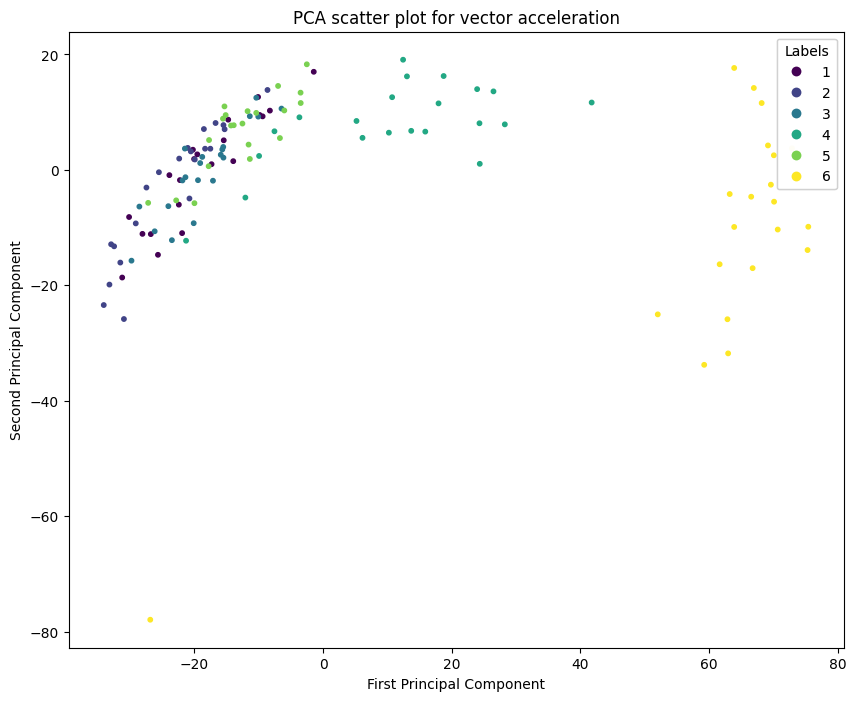

In [121]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

scaler = StandardScaler()
x_normalized = scaler.fit_transform(files_sorted_classes)
pca = PCA(n_components=2)
x_pca = pca.fit_transform(x_normalized)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(x_pca[:, 0], x_pca[:, 1], c=y_train_sorted, cmap='viridis', s=10)
plt.gca().add_artist(plt.legend(*scatter.legend_elements(), loc="upper right", title="Labels"))
plt.xlabel(f'First Principal Component')
plt.ylabel(f'Second Principal Component')
plt.title("PCA scatter plot for vector acceleration")
plt.show()

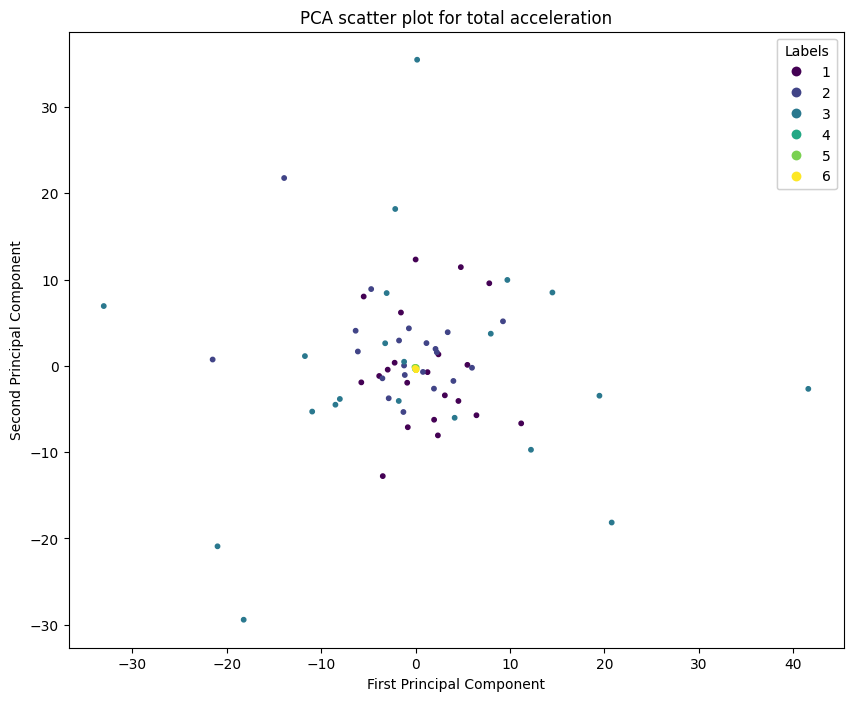

In [122]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

scaler = StandardScaler()
x_normalized = scaler.fit_transform(files_sorted_classes_total)
pca = PCA(n_components=2)
x_pca = pca.fit_transform(x_normalized)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(x_pca[:, 0], x_pca[:, 1], c=y_train_sorted, cmap='viridis', s=10)
plt.gca().add_artist(plt.legend(*scatter.legend_elements(), loc="upper right", title="Labels"))
plt.xlabel(f'First Principal Component')
plt.ylabel(f'Second Principal Component')
plt.title("PCA scatter plot for total acceleration")
plt.show()

Vector acceleration gives a clearer distinction between activities

## PCA on TSFEL Features

In [ ]:
import tsfel

#creating a nested list result, which stores the data generated by tsfel sorted according to the classes
result = []
for a in range(6):
    result.append([])

#Sorting according to the classes
files_sorted_classes = []
files_sorted_classes_total = []
#Sorting all the files accordind to the classes, appending individual acceleration as well as total acceleration separately
for a in range(6):
    files_sorted_classes.append([])
    files_sorted_classes_total.append([])

for datas in range(len(X_train)):
    index_ = y_train[datas]-1
    files_sorted_classes[index_].append(X_train[datas])
    lst = []
    for p in range(len(X_train[datas])):
        acc_total = X_train[datas][p][0]**2+ X_train[datas][p][1]**2  + X_train[datas][p][2]**2
        lst.append(acc_total)
    files_sorted_classes_total[index_].append(lst)
    
for a in range(len(files_sorted_classes_total)):
    for b in range(len(files_sorted_classes_total[a])):
        X_train_sig = pd.DataFrame(files_sorted_classes_total[a][b]) # accessing each of the file stored in the main list
        
        cfg_file = tsfel.get_features_by_domain()                                                        
        X_train = tsfel.time_series_features_extractor(cfg_file, X_train_sig, fs=50) #extracting data according to the fs = 50, which is the sampling frequency
        result[a].append(X_train.to_numpy()[0]) # appending the list in the result.

column_names = X_train

In [126]:
result = np.vstack(result)
result.shape

(126, 384)

this means that for each sample, TSFEL has given us 384 features.

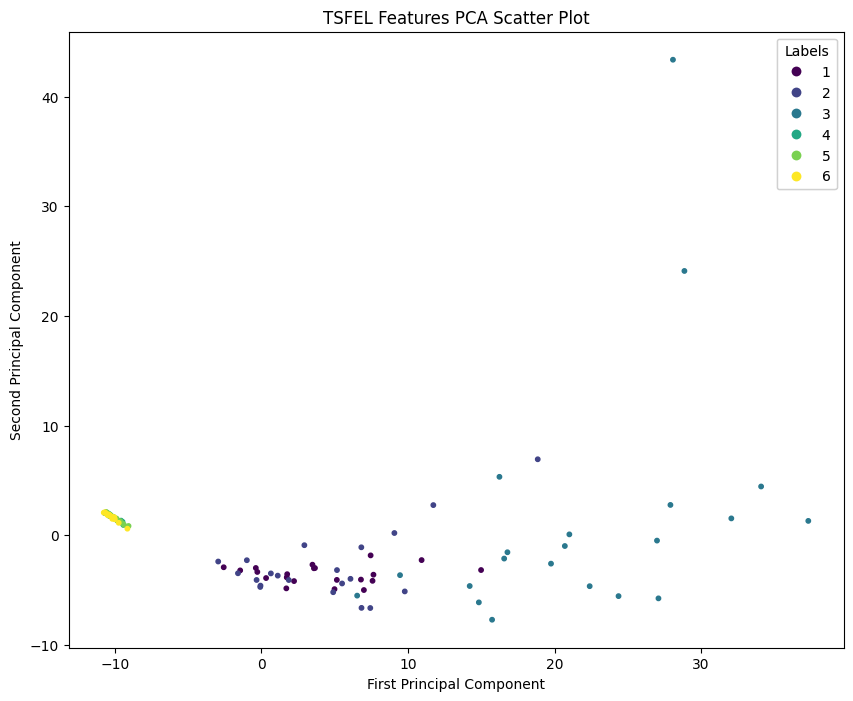

In [127]:
scaler = StandardScaler()
x_normalized = scaler.fit_transform(result)
pca = PCA(n_components=2)
x_pca = pca.fit_transform(x_normalized)
plt.figure(figsize=(10, 8))
scatter = plt.scatter(x_pca[:, 0], x_pca[:, 1], c=y_train_sorted, cmap='viridis', s=10)
plt.gca().add_artist(plt.legend(*scatter.legend_elements(), loc="upper right", title="Labels"))
plt.xlabel(f'First Principal Component')
plt.ylabel(f'Second Principal Component')
plt.title('TSFEL Features PCA Scatter Plot')
plt.show()

## PCA on 561 Feature Vector

Similar to previous task, in which the total number of features present in the raw files are 561, which are to be reduced to 2 features, by reducing the dimensions using PCA

In [128]:
#fetching raw files
df_x= pd.read_csv('HAR/UCI HAR Dataset/train/X_train.txt', delim_whitespace=True, header = None)
df_y= pd.read_csv('HAR/UCI HAR Dataset/train/y_train.txt', delim_whitespace=True, header = None)

/var/folders/nx/hp2vpgr15lsfzsnf9zg0ys_c0000gn/T/ipykernel_8273/3564425076.py:2: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df_x= pd.read_csv('HAR/UCI HAR Dataset/train/X_train.txt', delim_whitespace=True, header = None)
/var/folders/nx/hp2vpgr15lsfzsnf9zg0ys_c0000gn/T/ipykernel_8273/3564425076.py:3: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df_y= pd.read_csv('HAR/UCI HAR Dataset/train/y_train.txt', delim_whitespace=True, header = None)


In [129]:
y_array = np.array(df_y[0])
x_array = np.array(df_x[:])
print(np.shape(y_array))
print(np.shape(x_array))
#converting the dataframes into np arrays

(7352,)
(7352, 561)


In [130]:
y_array_sorted = sorted(y_array)

In [131]:
classes_sort = []
for a in range(6):
    classes_sort.append([])

for a in range(len(x_array)):
    index_ = y_array[a]-1
    classes_sort[index_].append(x_array[a])

#Again we need to sort the data according to the classes, so that we can apply PCA
#performing PCA on all the classes

# results_features_data = []
# for a in range(6):
#     combined_data = np.vstack(classes_sort[a])
#     n_components = 2
#     pca_generate = PCA(n_components=n_components)
#     principal_components = pca_generate.fit_transform(combined_data)
#     print(shape(principal_components))
#     results_features_data.append(principal_components)

In [132]:
classes_sorted_all = np.vstack(classes_sort)
np.shape(classes_sorted_all)

(7352, 561)

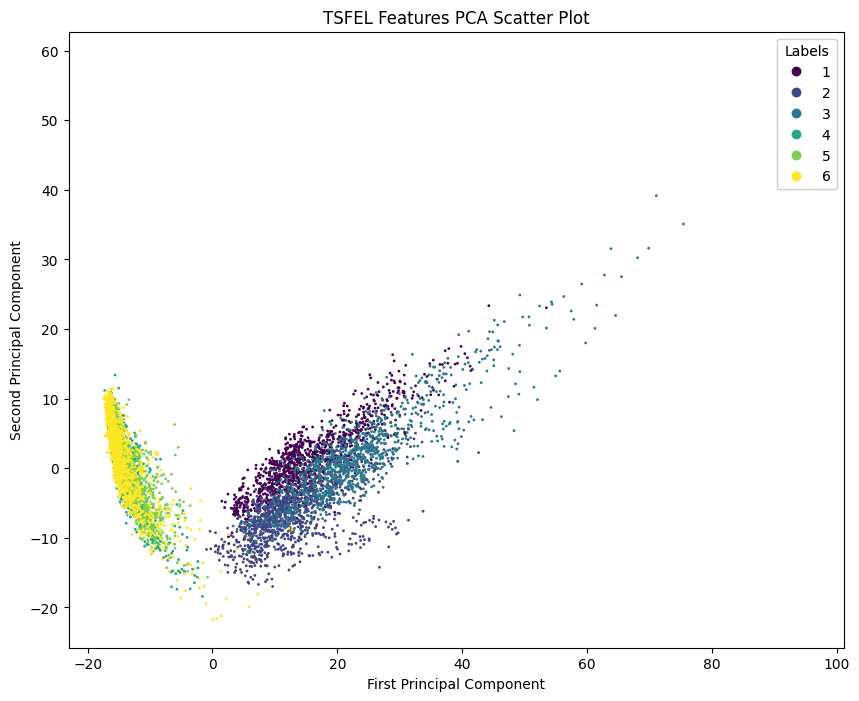

In [133]:
scaler = StandardScaler()
x_normalized = scaler.fit_transform(classes_sorted_all)
pca = PCA(n_components=2)
x_pca = pca.fit_transform(x_normalized)
plt.figure(figsize=(10, 8))
scatter = plt.scatter(x_pca[:, 0], x_pca[:, 1], c=y_array_sorted, cmap='viridis', s=1)
plt.gca().add_artist(plt.legend(*scatter.legend_elements(), loc="upper right", title="Labels"))
plt.xlabel(f'First Principal Component')
plt.ylabel(f'Second Principal Component')
plt.title('TSFEL Features PCA Scatter Plot')
plt.show()

## Comparing PCA Results

The PCA visualization of TSFEL and UCI HAR dataset features reveals a clear separation between classes, unlike the PCA of total acceleration. This indicates that decision trees might benefit from using these features instead of raw data. While it's challenging to predict which feature set will perform best due to the significant dimensionality reduction, the PCA of linear acceleration shows that dynamic activities are widely dispersed, while static activities are more clustered. This suggests that TSFEL and UCI HAR features could be particularly effective in decision tree models.

# Question_4

In the following question we have generated correlation matrix between the features generated by tsfel, and I have chosen all the features which are highly correlated, by setting a threshold value of 0.9. These features are highly redundant, which mean, that actually training them does not add up the information to the training model much.

In [ ]:
time = 20
offset = 1000
folders = ["LAYING", "SITTING", "STANDING", "WALKING", "WALKING_DOWNSTAIRS", "WALKING_UPSTAIRS"]
classes = {"WALKING": 1, "WALKING_UPSTAIRS": 2, "WALKING_DOWNSTAIRS": 3, "SITTING": 4, "STANDING": 5, "LAYING": 6}
combined_dir = os.path.join("Combined")
dataset_dir = os.path.join(combined_dir, "Train")  # Focus on the training set

# Load and prepare data
X_train = [] # Sensor data
y_train = [] # Activity labels

# Get acitivity data
for folder in folders:
    files = os.listdir(os.path.join(dataset_dir, folder))
    # Only get the first file for each activity
    file = files[5]

    df = pd.read_csv(os.path.join(dataset_dir, folder, file), sep=",", header=0)
    # Skip first 100 rows and get 50 seconds of data to avoid initial and ending noise
    df = df[offset:offset + time * 50]

    X_train.append(df.values)
    y_train.append(classes[folder])

X_train = np.array(X_train)
y_train = np.array(y_train)

print("X_train shape:", X_train.shape) # 3D array
print("y_train shape:", y_train.shape) # 1D array

# Define a list of activities
activities = ["WALKING", "WALKING_UPSTAIRS", "WALKING_DOWNSTAIRS", "SITTING", "STANDING", "LAYING"]

import tsfel

#creating a nested list result, which stores the data generated by tsfel sorted according to the classes
result = []
for a in range(6):
    result.append([])

#Sorting according to the classes
files_sorted_classes = []
files_sorted_classes_total = []
#Sorting all the files accordind to the classes, appending individual acceleration as well as total acceleration separately
for a in range(6):
    files_sorted_classes.append([])
    files_sorted_classes_total.append([])

for datas in range(len(X_train)):
    index_ = y_train[datas]-1
    files_sorted_classes[index_].append(X_train[datas])
    lst = []
    for p in range(len(X_train[datas])):
        acc_total = X_train[datas][p][0]**2+ X_train[datas][p][1]**2  + X_train[datas][p][2]**2
        lst.append(acc_total)
    files_sorted_classes_total[index_].append(lst)
    
for a in range(len(files_sorted_classes_total)):
    for b in range(len(files_sorted_classes_total[a])):
        X_train_sig = pd.DataFrame(files_sorted_classes_total[a][b]) # accessing each of the file stored in the main list
        
        cfg_file = tsfel.get_features_by_domain()                                                        
        X_train = tsfel.time_series_features_extractor(cfg_file, X_train_sig, fs=50) #extracting data according to the fs = 50, which is the sampling frequency
        result[a].append(X_train.to_numpy()[0]) # appending the list in the result.

(6, 1, 389)
(6, 389)
0.13095768933348642
1.0
False


<Axes: >

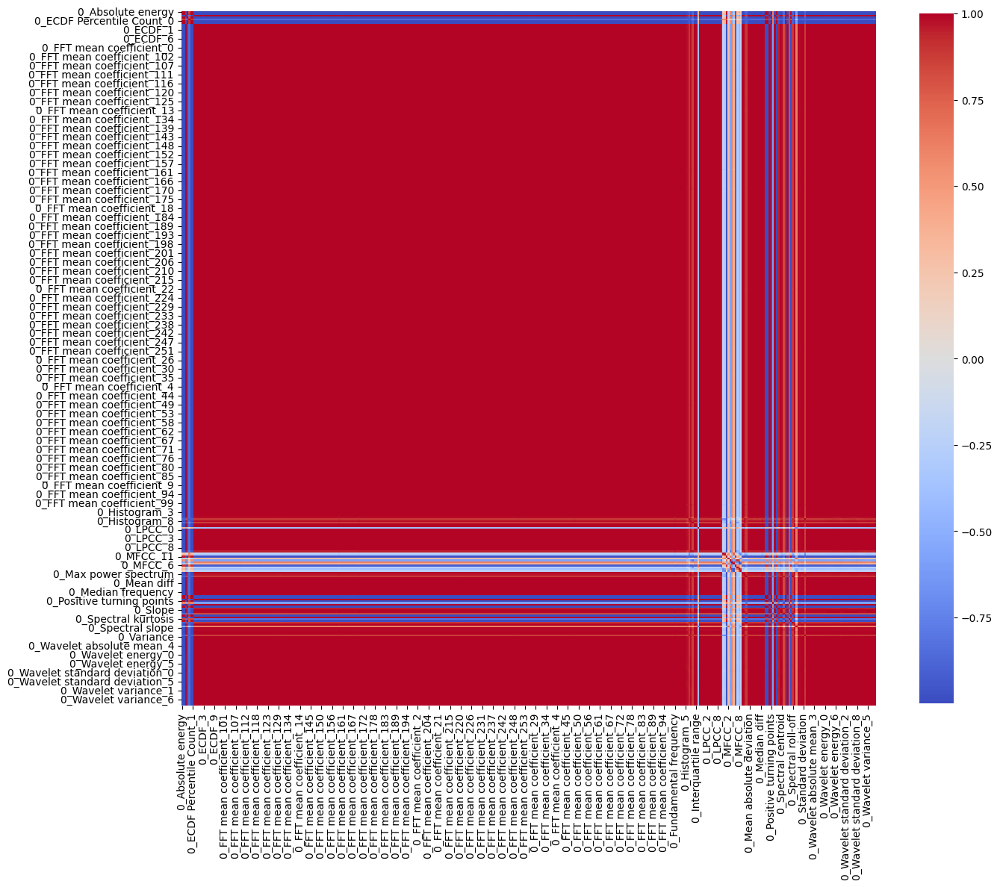

In [144]:
import seaborn as sns

#applying this on the data obtained by TSFEL
print(np.shape(result))
data_combined = []

for a in range(len(result)):
    for b in range(len(result[a])):
        # print(result[a][b])
        #standardizing the data such that the mean of the data = 0, and std dev of the data to be one.
        means = result[a][b].mean()
        std_dev = result[a][b].std()
        if std_dev==0: #if for some distorted rows, if the standard deviation comes out to be zero, then division error will be raised, and to avoid that, better to append a np.zero array
            print("error")
            standardization_combined = np.zeros_like(result[a][b])
            data_combined.append(standardization_combined)
        else:
            standardization_combined = (result[a][b]-means)/std_dev
            data_combined.append(standardization_combined)


print(np.shape(data_combined))
print(np.max(data_combined))
# data_combined = np.array(data_combined)
df_combined = pd.DataFrame(data_combined) #this the the dataframe, which can be converted to correlation matrix

# corr_matrix_combined = df_combined.corr()
corr_matrix_combined = np.corrcoef(df_combined, rowvar=False) #obtaining correlation matrix by using inbuilt 

print(np.max(corr_matrix_combined)) #checking that all the values are capped to 1
print( np.isnan(corr_matrix_combined).any()) #checking if there is nan value which should not be there

corr_matrix = pd.DataFrame(corr_matrix_combined, columns=X_train.columns, index=X_train.columns) #giving the corr_matrix, the column names
plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(corr_matrix, cmap='coolwarm', center=0, cbar_kws={'shrink': 0.8}, square=True)

In [145]:
column_name = X_train.columns.tolist()

#Extracting the features which are highly correlated, that is the the features whose correlation are greater than the threshold value of 0.9
numpy_arr = corr_matrix.to_numpy()
sorted_list = []
for a in range(len(numpy_arr)):
    for b in range(len(numpy_arr)):
        if numpy_arr[a][b]>0.9:
            sorted_list.append([column_name[a],column_name[b]])
        # sorted_list.append([numpy_arr[a][b],a,b])
        
# sorted_list = sorted(sorted_list, key=lambda x: x[0])
# sorted_list = sorted_list[::-1]
# print("Highly correlated feature")
# for c in range(len(sorted_list[:10])):
#     print(f"{column_name[sorted_list[c][2]]} and {column_name[sorted_list[c][1]]} having the value: {sorted_list[c][0]}")
    
for a in range(len(sorted_list)):
    print(f"{sorted_list[a][0]} and {sorted_list[a][1]}")

0_Absolute energy and 0_Absolute energy
0_Absolute energy and 0_Area under the curve
0_Absolute energy and 0_Average power
0_Absolute energy and 0_ECDF Percentile Count_0
0_Absolute energy and 0_ECDF Percentile Count_1
0_Absolute energy and 0_MFCC_11
0_Absolute energy and 0_MFCC_6
0_Absolute energy and 0_Negative turning points
0_Absolute energy and 0_Neighbourhood peaks
0_Absolute energy and 0_Positive turning points
0_Absolute energy and 0_Signal distance
0_Absolute energy and 0_Spectral distance
0_Absolute energy and 0_Spectral positive turning points
0_Area under the curve and 0_Absolute energy
0_Area under the curve and 0_Area under the curve
0_Area under the curve and 0_Average power
0_Area under the curve and 0_ECDF Percentile Count_0
0_Area under the curve and 0_ECDF Percentile Count_1
0_Area under the curve and 0_MFCC_11
0_Area under the curve and 0_Negative turning points
0_Area under the curve and 0_Neighbourhood peaks
0_Area under the curve and 0_Positive turning points
0_A

/var/folders/nx/hp2vpgr15lsfzsnf9zg0ys_c0000gn/T/ipykernel_8273/1525356631.py:4: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  vec = pd.read_csv('HAR/UCI HAR Dataset/train/X_train.txt', delim_whitespace=True, header=None)
/var/folders/nx/hp2vpgr15lsfzsnf9zg0ys_c0000gn/T/ipykernel_8273/1525356631.py:6: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  features = pd.read_csv('HAR/UCI HAR Dataset/features.txt', delim_whitespace=True, header=None)


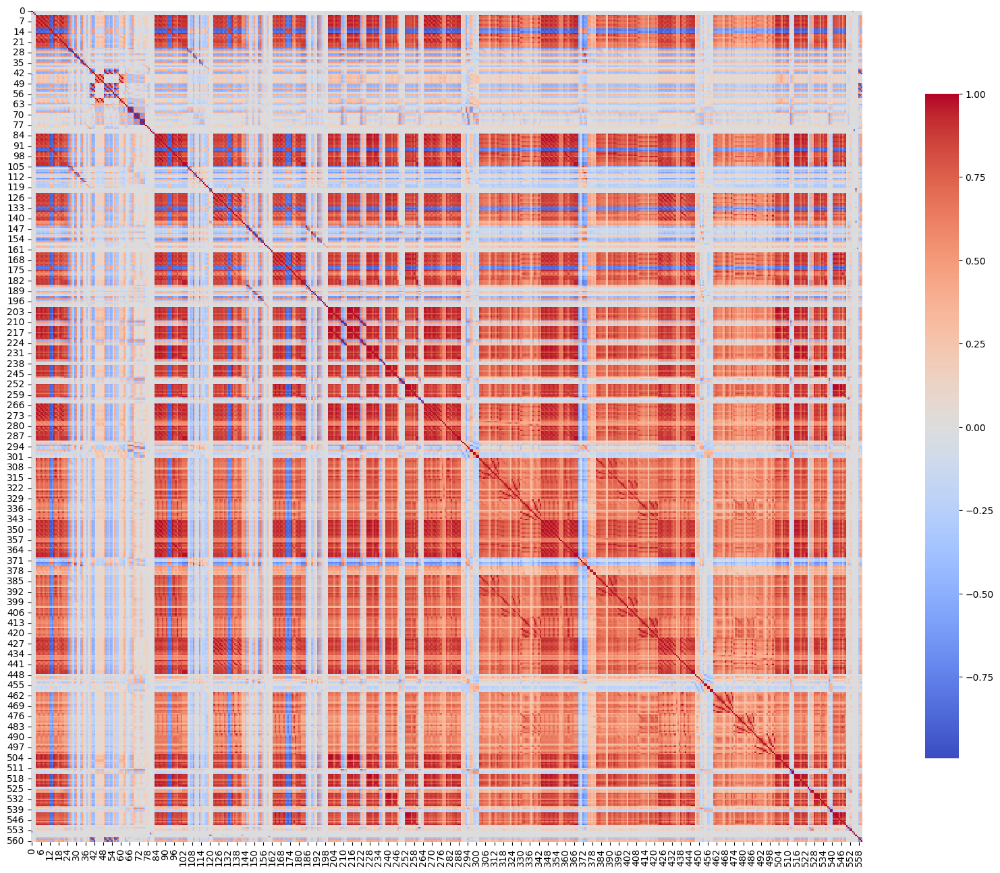

In [146]:
import seaborn as sns
import matplotlib.pyplot as plt

vec = pd.read_csv('HAR/UCI HAR Dataset/train/X_train.txt', delim_whitespace=True, header=None)
corr = vec.corr()
features = pd.read_csv('HAR/UCI HAR Dataset/features.txt', delim_whitespace=True, header=None)
features = features[1].tolist()

plt.figure(figsize=(24, 16))  # Adjust the figure size as needed
sns.heatmap(corr, cmap='coolwarm', center=0, cbar_kws={'shrink': 0.8}, square=True)
plt.show()

In [147]:
mask = np.triu(np.ones_like(corr, dtype=bool))
tri_df = corr.mask(mask)
to_drop = [c for c in tri_df.columns if any(tri_df[c] > 0.9)] # threshold = 0.9
print(f'There are {len(to_drop)} highy correlated features, namely: \n')
for f in to_drop:
    print(features[f])

There are 348 highy correlated features, namely: 

tBodyAcc-std()-X
tBodyAcc-std()-Y
tBodyAcc-std()-Z
tBodyAcc-mad()-X
tBodyAcc-mad()-Y
tBodyAcc-mad()-Z
tBodyAcc-max()-X
tBodyAcc-max()-Y
tBodyAcc-max()-Z
tBodyAcc-min()-X
tBodyAcc-min()-Y
tBodyAcc-min()-Z
tBodyAcc-sma()
tBodyAcc-energy()-X
tBodyAcc-energy()-Y
tBodyAcc-energy()-Z
tBodyAcc-iqr()-X
tBodyAcc-iqr()-Y
tBodyAcc-iqr()-Z
tBodyAcc-entropy()-X
tBodyAcc-entropy()-Y
tBodyAcc-arCoeff()-X,1
tBodyAcc-arCoeff()-Y,1
tBodyAcc-arCoeff()-Z,1
tGravityAcc-mean()-X
tGravityAcc-mean()-Y
tGravityAcc-mean()-Z
tGravityAcc-std()-X
tGravityAcc-std()-Y
tGravityAcc-std()-Z
tGravityAcc-mad()-X
tGravityAcc-mad()-Y
tGravityAcc-mad()-Z
tGravityAcc-max()-X
tGravityAcc-max()-Y
tGravityAcc-max()-Z
tGravityAcc-min()-X
tGravityAcc-arCoeff()-X,1
tGravityAcc-arCoeff()-X,2
tGravityAcc-arCoeff()-Y,1
tGravityAcc-arCoeff()-Y,2
tGravityAcc-arCoeff()-Z,1
tGravityAcc-arCoeff()-Z,2
tBodyAccJerk-std()-X
tBodyAccJerk-std()-Y
tBodyAccJerk-std()-Z
tBodyAccJerk-mad()-X
tBody